In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [56]:
R1_1 = pd.read_csv('round-5-island-data-bottle/trades_round_1_day_-1_wn.csv',delimiter=';')
R1_0 = pd.read_csv('round-5-island-data-bottle/trades_round_1_day_-2_wn.csv',delimiter=';')
R1_2 = pd.read_csv('round-5-island-data-bottle/trades_round_1_day_0_wn.csv',delimiter=';')
R3_0 = pd.read_csv('round-5-island-data-bottle/trades_round_3_day_0_wn.csv',delimiter=';')
R3_1 = pd.read_csv('round-5-island-data-bottle/trades_round_3_day_1_wn.csv',delimiter=';')
R3_2 = pd.read_csv('round-5-island-data-bottle/trades_round_3_day_2_wn.csv',delimiter=';')
R4_0 = pd.read_csv('round-5-island-data-bottle/trades_round_4_day_1_wn.csv',delimiter=';')
R4_1 = pd.read_csv('round-5-island-data-bottle/trades_round_4_day_2_wn.csv',delimiter=';')
R4_2 = pd.read_csv('round-5-island-data-bottle/trades_round_4_day_3_wn.csv',delimiter=';')
R1_1['day'] = -1
R1_0['day'] = -2
R1_2['day'] = 0
R3_0['day'] = 0
R3_1['day']= 1
R3_2['day']= 2
R4_0['day'] = 1
R4_1['day'] = 2
R4_2['day'] = 3

R1_1['timestamp'] = R1_1['timestamp'] + 10**6
R1_2['timestamp'] = R1_2['timestamp'] + 2*10**6
R3_1['timestamp'] = R3_1['timestamp'] + 10**6
R3_2['timestamp'] = R3_2['timestamp'] + 2*10**6
R4_1['timestamp'] = R4_1['timestamp'] + 10**6
R4_2['timestamp'] = R4_2['timestamp'] + 2*10**6

R1 = pd.concat([R1_1, R1_0, R1_2],axis=0).reset_index(drop=True).sort_values(['timestamp'],ascending=True)
R3 = pd.concat([R3_0, R3_1, R3_2],axis=0).reset_index(drop=True).sort_values(['timestamp'],ascending=True)
R4 = pd.concat([R4_0, R4_1, R4_2],axis=0).reset_index(drop=True).sort_values(['timestamp'],ascending=True)

combine_df = pd.concat([R1_1,R1_0,R1_2,R3_0,R3_1,R3_2,R4_0,R4_1,R4_2],axis=0).reset_index(drop=True).sort_values(['day','timestamp'],ascending=True)

In [293]:
R3_0_price = pd.read_csv('R3_day0.csv',delimiter=';')
R3_1_price = pd.read_csv('R3_day1.csv',delimiter=';')
R3_2_price = pd.read_csv('R3_day2.csv',delimiter=';')
R3_1_price['timestamp'] = R3_1_price['timestamp'] + 10**6
R3_2_price['timestamp'] = R3_2_price['timestamp'] + 2*10**6

R4_0_price = pd.read_csv('R4_day1.csv',delimiter=';')
R4_1_price = pd.read_csv('R4_day2.csv',delimiter=';')
R4_2_price = pd.read_csv('R4_day3.csv',delimiter=';')
R4_1_price['timestamp'] = R4_1_price['timestamp'] + 10**6
R4_2_price['timestamp'] = R4_2_price['timestamp'] + 2*10**6

R1_0_price = pd.read_csv('R1_day-1.csv',delimiter=';')
R1_1_price = pd.read_csv('R1_day-2.csv',delimiter=';')
R1_2_price = pd.read_csv('R1_day0.csv',delimiter=';')
R1_1_price['timestamp'] = R1_1_price['timestamp'] + 10**6
R1_2_price['timestamp'] = R1_2_price['timestamp'] + 2*10**6

R1_price = pd.concat([R1_0_price,R1_1_price,R1_2_price],axis=0).reset_index(drop=True).sort_values(['day','timestamp'],ascending=True)
R3_price = pd.concat([R3_0_price,R3_1_price,R3_2_price],axis=0).reset_index(drop=True).sort_values(['day','timestamp'],ascending=True)
R4_price = pd.concat([R4_0_price,R4_1_price,R4_2_price],axis=0).reset_index(drop=True).sort_values(['day','timestamp'],ascending=True)

In [549]:
class counterparty_trades:
    def __init__(self, counterparty, trade_df, price_df):
        self.counterparty = counterparty
        self.trade_df = trade_df
        self.price_df = price_df

    def get_counterparty(self):
        return set(self.trade_df.buyer.unique()).union(set(self.trade_df.seller.unique()))

    def get_products(self):
        return self.trade_df[(self.trade_df['buyer']==self.counterparty) | (self.trade_df['seller']==self.counterparty)]['symbol'].unique()
        
    def compute_signals(self,product):
        buy_signal = self.trade_df[(self.trade_df['buyer']==self.counterparty) & (self.trade_df['symbol']==product)]
        sell_signal = self.trade_df[(self.trade_df['seller']==self.counterparty) & (self.trade_df['symbol']==product)]
        return buy_signal, sell_signal
        
    def plot_signals(self, product):

        buy_signal, sell_signal = self.compute_signals(product)
        
        product_df = self.price_df[self.price_df['product']==product]
        product_prices = product_df['mid_price']
        
        plt.figure(figsize=(25, 6))
        plt.title(f"{self.counterparty} {product} trades")
        plt.plot(product_df['timestamp'],product_df['mid_price'], label=product, linewidth = 0.5, alpha = 0.3)
        
        plt.scatter(buy_signal['timestamp'],buy_signal['price'], s=buy_signal['quantity'],c='green', label='BUYS')
        plt.scatter(sell_signal['timestamp'],sell_signal['price'], s=sell_signal['quantity'], c='red', label='SELLS')
        
        plt.axvline(x=10**6, color='black', linestyle='--')
        plt.axvline(x=2*10**6, color='black', linestyle='--')
        plt.legend()
        plt.show()

    def get_position_series_cumulative(self,product):
        
        buy_signal, sell_signal = self.compute_signals(product)
        sell_signal.loc[:,'quantity'] *= -1
        signals = pd.concat([buy_signal,sell_signal],axis=0).reset_index(drop=True).sort_values(by='timestamp',ascending=True)
        length = 30000
        position_series = pd.Series(0, index=range(length))
        
        for t in signals.timestamp:
            position_series[int(t/100):] += signals.loc[signals['timestamp'] == t, 'quantity'].values[0]

        return position_series

    def get_PnL_cumulative(self,product):

        position_series = self.get_position_series(product)
        product_prices = self.price_df[self.price_df['product']==product]['mid_price'].reset_index(drop=True)
        pnl_series = position_series * product_prices.diff().shift(-1)
        pnl_series = pnl_series.fillna(0)

        pnl_array = [0]

        for i, pos in enumerate(position_series[1:]):
            i+=1
            price_diff = product_prices[i] - product_prices[i-1]
            pnl_array.append(pnl_array[i-1] + price_diff*position_series[i])
        
        return pnl_array

    def plot_PnL(self, product):
        pnl_series = self.get_PnL(product)
        pnl_series = pd.Series(pnl_series)
        position_series = self.get_position_series(product)
        
        fig, ax1 = plt.subplots(figsize=(25, 6))
        ax1.set_title(f"{self.counterparty} {product} PnL")
        ax1.plot(pnl_series.index, pnl_series.values, label=product, linewidth = 0.5)
        
        ax2 = ax1.twinx()
        ax2.plot(position_series.index, position_series.values, label='position', color='orange')

        
        plt.axvline(x=10**4, color='black', linestyle='--')
        plt.axvline(x=2*10**4, color='black', linestyle='--')
        plt.legend()
        plt.show()

    def generate_summary_report(self, LAG=[1]):
        
        report_df = [self.pnl_report()]
        
        for i in LAG:
            report_df.append(self.lag_signal_report(LAG=i))
        
        report_df = pd.concat(report_df,axis=0)
        
        return report_df

    def pnl_report(self):
        pnl = {}
        products = self.get_products()
        for product in products:
            pnl[product] = []
            pnl[product].append(self.get_PnL(product)[9999])
            pnl[product].append(self.get_PnL(product)[19999] - self.get_PnL(product)[9999])
            pnl[product].append(self.get_PnL(product)[29999] - self.get_PnL(product)[19999] - self.get_PnL(product)[9999])
            pnl[product].append(self.get_PnL(product)[29999])

        pnl_df = pd.DataFrame(pnl, index=['day1_PnL','day2_PnL','day3_PnL','total_PnL'])
        return pnl_df
    
    def lag_signal_report(self, LAG=1):
        lag_winrate = {}
        products = self.get_products()
        
        for product in products:
            lag_winrate[product] = []
            # generate win rates (1 day lag - see if its leading indicator)
            buy_signal, sell_signal = self.compute_signals(product)
            product_df = self.price_df[self.price_df['product']==product].reset_index(drop=True)
            
            buy_count = len(buy_signal)
            buy_win = 0
            for timestamp in buy_signal.timestamp:
                try:
                    diff = product_df[product_df['timestamp']==timestamp+LAG*100]['mid_price'].values[0] - product_df[product_df['timestamp']==timestamp]['mid_price'].values[0]
                    if diff > 0:
                        buy_win += 1
                except:
                    continue

            lag_winrate[product].append(buy_win/buy_count)

            sell_count = len(sell_signal)
            sell_win = 0
            for timestamp in buy_signal.timestamp:
                try:
                    diff = product_df[product_df['timestamp']==timestamp+LAG*100]['mid_price'].values[0] - product_df[product_df['timestamp']==timestamp]['mid_price'].values[0]
                    if diff < 0:
                        sell_win += 1
                except:
                    continue

            lag_winrate[product].append(sell_win/sell_count)

        lag_winrate_df = pd.DataFrame(lag_winrate, index=[f'lag{LAG}_buy_win%', f'lag{LAG}_sell_win%'])

        return lag_winrate_df

    def get_position_series(self,product):
        
        buy_signal, sell_signal = self.compute_signals(product)
        sell_signal.loc[:,'quantity'] *= -1
        signals = pd.concat([buy_signal,sell_signal],axis=0).reset_index(drop=True).sort_values(by='timestamp',ascending=True)
        day_length = 10000
        
        day1_pos = pd.Series(0, index=range(day_length))
        day2_pos = pd.Series(0, index=range(day_length))
        day3_pos = pd.Series(0, index=range(day_length))
        
        for t in signals.timestamp:
            if t//1000000==0:
                day1_pos[int(t/100):] += signals.loc[signals['timestamp'] == t, 'quantity'].values[0]
            if t//1000000==1:
                day2_pos[int(t%10**6/100):] += signals.loc[signals['timestamp'] == t, 'quantity'].values[0]
            if t//1000000==2:
                day3_pos[int(t%10**6/100):] += signals.loc[signals['timestamp'] == t, 'quantity'].values[0]

        position_series = pd.concat([day1_pos, day2_pos, day3_pos],axis=0).reset_index(drop=True)
        return position_series

    def get_PnL(self,product):

        position_series = self.get_position_series(product)
        product_prices = self.price_df[self.price_df['product']==product]['mid_price'].reset_index(drop=True)
        pnl_series = position_series * product_prices.diff().shift(-1)
        pnl_series = pnl_series.fillna(0)

        pnl_array = [0]

        for i, pos in enumerate(position_series[1:]):
            i+=1
            if i%10000==0:
                pnl_array.append(0)
                continue
            price_diff = product_prices[i] - product_prices[i-1]
            pnl_array.append(pnl_array[i-1] + price_diff*position_series[i])
        
        return pnl_array

    def get_adjusted_position_series(self, product):
        buy_signal, sell_signal = self.compute_signals(product)
        sell_signal.loc[:,'quantity'] *= -1
        signals = pd.concat([buy_signal,sell_signal],axis=0).reset_index(drop=True).sort_values(by='timestamp',ascending=True)
        day_length = 10000
        
        day1_pos = pd.Series(0, index=range(day_length))
        day2_pos = pd.Series(0, index=range(day_length))
        day3_pos = pd.Series(0, index=range(day_length))
        
        for t in signals.timestamp:
            
            signal = signals.loc[signals['timestamp'] == t, 'quantity'].values[0]
            if signal > 0:
                signal = 1
            elif signal < 0:
                signal = -1
            else:
                signal = 0
                
            if t//1000000==0:
                day1_pos[int(t/100):] = signal
            if t//1000000==1:
                day2_pos[int(t%10**6/100):] = signal
            if t//1000000==2:
                day3_pos[int(t%10**6/100):] = signal

        position_series = pd.concat([day1_pos, day2_pos, day3_pos],axis=0).reset_index(drop=True)
        return position_series

    def get_adjusted_PnL(self,product):

        position_series = self.get_adjusted_position_series(product)
        product_prices = self.price_df[self.price_df['product']==product]['mid_price'].reset_index(drop=True)
        pnl_series = position_series * product_prices.diff().shift(-1)
        pnl_series = pnl_series.fillna(0)

        pnl_array = [0]

        for i, pos in enumerate(position_series[1:]):
            i+=1
            if i%10000==0:
                pnl_array.append(0)
                continue
            price_diff = product_prices[i] - product_prices[i-1]
            pnl_array.append(pnl_array[i-1] + price_diff*position_series[i])
        
        return pnl_array

    def plot_adjusted_PnL(self, product):
        pnl_series = self.get_adjusted_PnL(product)
        pnl_series = pd.Series(pnl_series)
        position_series = self.get_adjusted_position_series(product)
        
        fig, ax1 = plt.subplots(figsize=(25, 6))
        ax1.set_title(f"{self.counterparty} {product} ADJUSTED PnL")
        ax1.plot(pnl_series.index, pnl_series.values, label=product, linewidth = 0.5)
        
        ax2 = ax1.twinx()
        ax2.plot(position_series.index, position_series.values, label='position', color='orange',alpha=0.3)

        
        plt.axvline(x=10**4, color='black', linestyle='--')
        plt.axvline(x=2*10**4, color='black', linestyle='--')
        plt.legend()
        plt.show()

# Round 3

1. Rose signal from Rhianna obviously
2. Vinnie strong win rates


In [528]:
counterparty_trades("Rhianna", R3, R3_price).get_counterparty()

{'Remy', 'Rhianna', 'Ruby', 'Vinnie', 'Vladimir'}

In [529]:
rhianna_r3 = counterparty_trades("Rhianna", R3, R3_price)
remy_r3 = counterparty_trades("Remy", R3, R3_price)
ruby_r3 = counterparty_trades("Ruby", R3, R3_price)
vinnie_r3 = counterparty_trades("Vinnie", R3, R3_price)
vladimir_r3 = counterparty_trades("Vladimir", R3, R3_price)

## Rhianna 

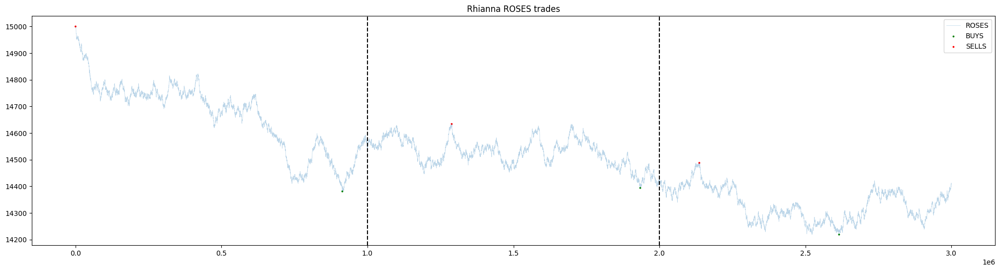

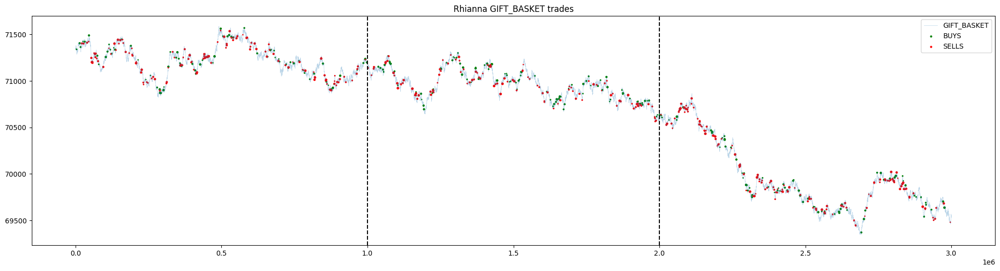

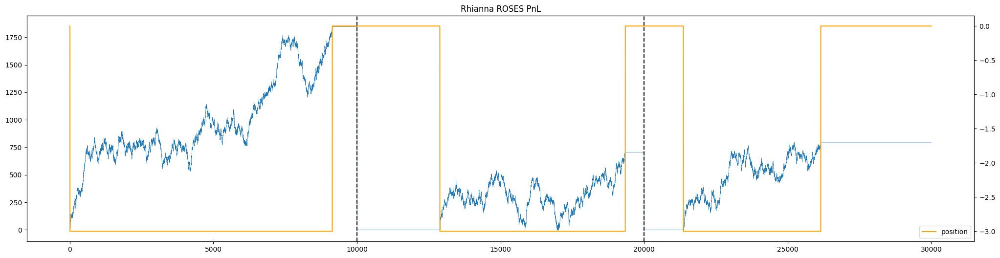

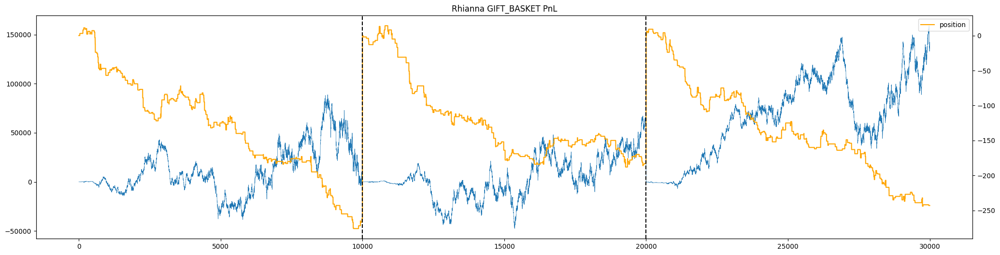

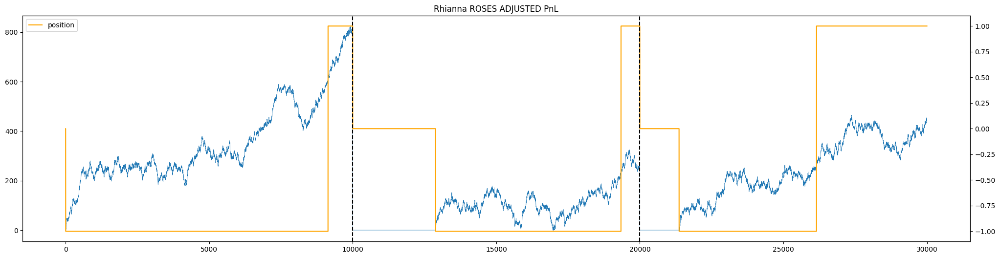

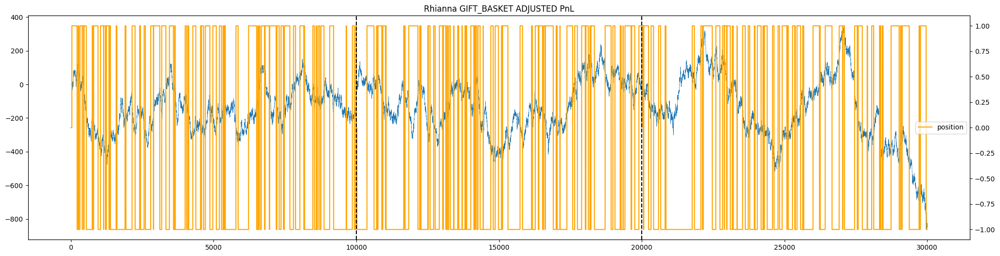

In [517]:
counterparty_df = rhianna_r3
for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_signals(PRODUCT)

counterparty_df = rhianna_r3
for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_PnL(PRODUCT)

for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_adjusted_PnL(PRODUCT)

In [518]:
counterparty_df = rhianna_r3
rhianna_r3_report = counterparty_df.generate_summary_report(LAG=[1,5])
rhianna_r3_report

,ROSES,GIFT_BASKET
day1_PnL,1848.0,26460.500000
day2_PnL,-1143.0,36007.000000
day3_PnL,-1761.0,46843.500000
total_PnL,792.0,135771.500000
lag1_buy_win%,1.0,0.296089
lag1_sell_win%,0.0,0.410473
lag5_buy_win%,1.0,0.324022
lag5_sell_win%,0.0,0.396959


## Remy

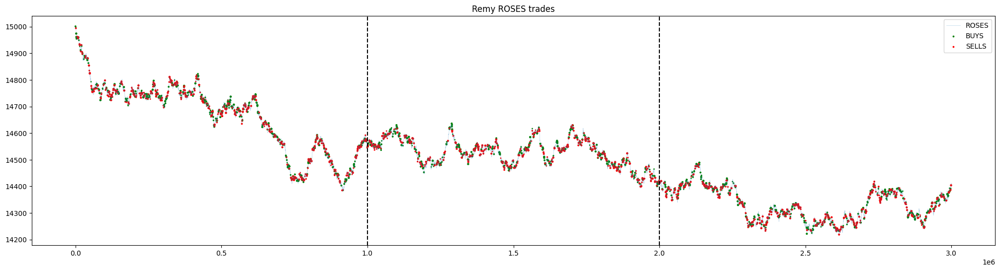

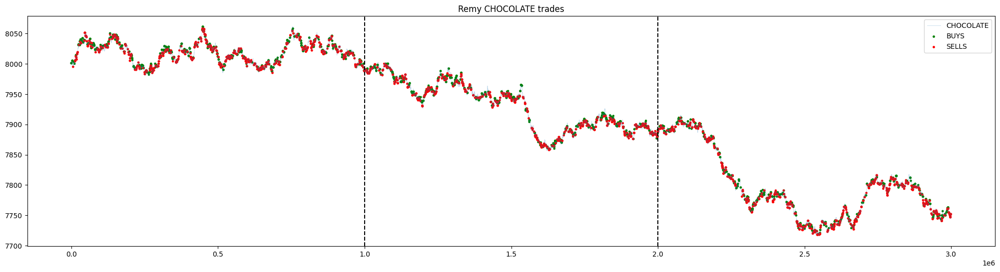

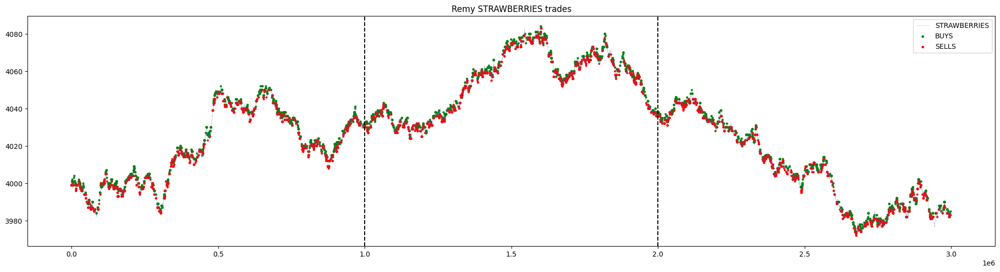

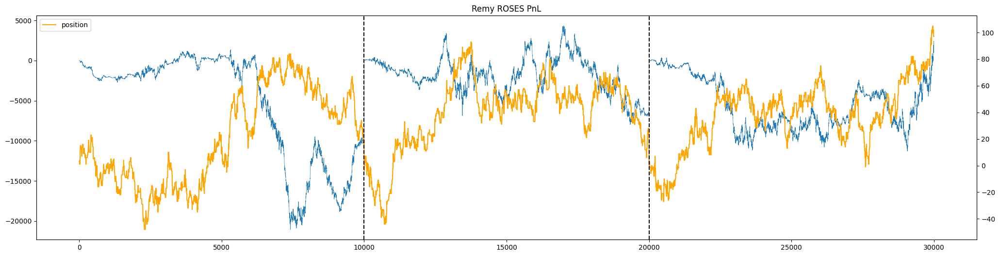

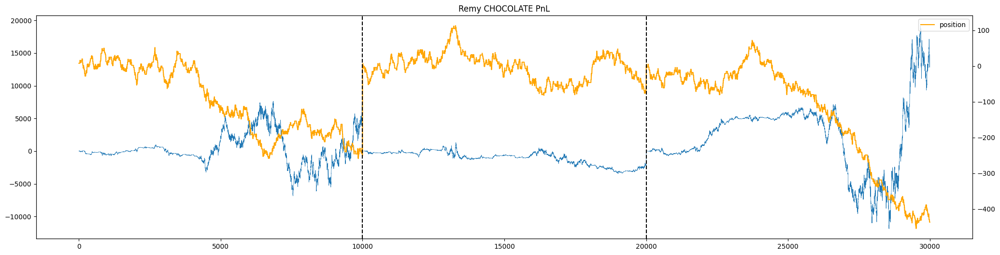

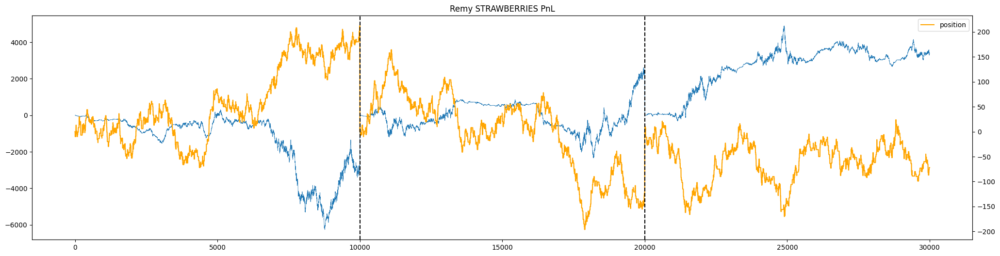

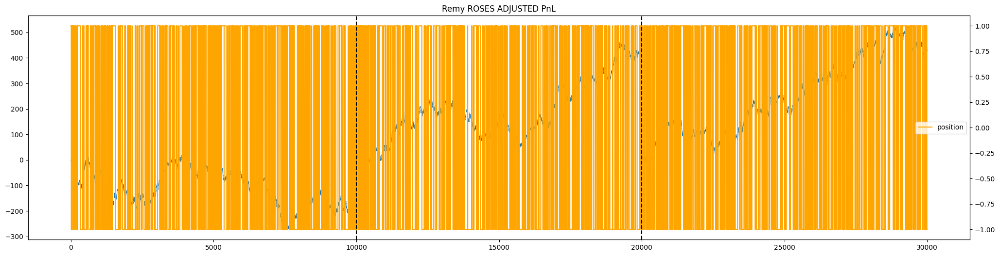

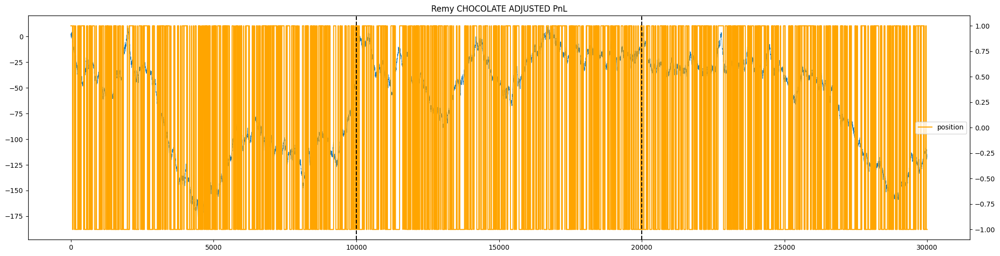

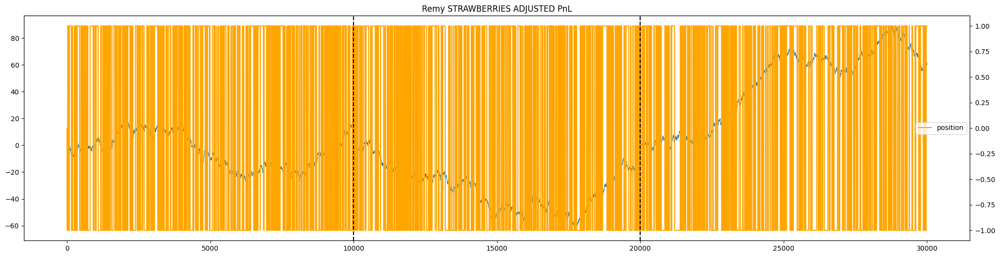

In [519]:
counterparty_df = remy_r3
for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_signals(PRODUCT)

counterparty_df = remy_r3
for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_PnL(PRODUCT)

for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_adjusted_PnL(PRODUCT)

In [478]:
counterparty_df = remy_r3
remy_r3_report = counterparty_df.generate_summary_report(LAG=[1,5])
remy_r3_report

,ROSES,CHOCOLATE,STRAWBERRIES
day1_PnL,-10492.500000,6662.000000,-3150.000000
day2_PnL,4050.500000,-9204.500000,5601.500000
day3_PnL,19258.000000,10664.000000,4058.500000
total_PnL,2323.500000,14783.500000,3360.000000
lag1_buy_win%,0.464260,0.411328,0.281476
lag1_sell_win%,0.445494,0.362795,0.247557
lag5_buy_win%,0.503892,0.442897,0.410585
lag5_sell_win%,0.477471,0.409091,0.377036


## Ruby

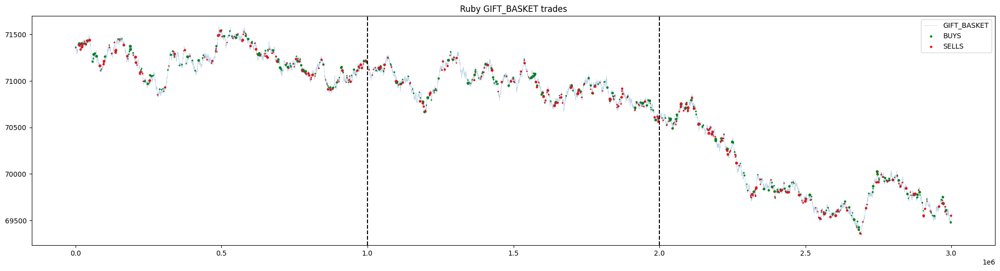

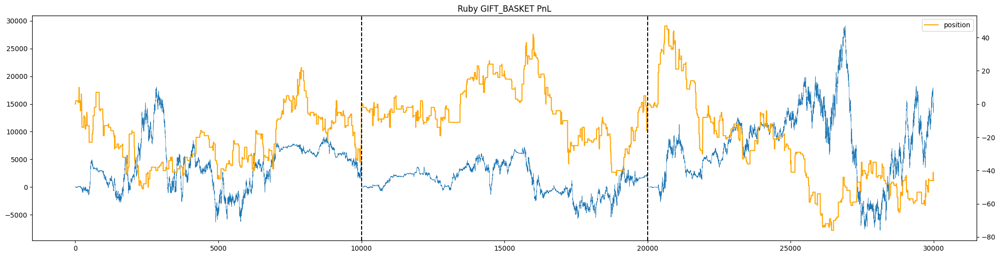

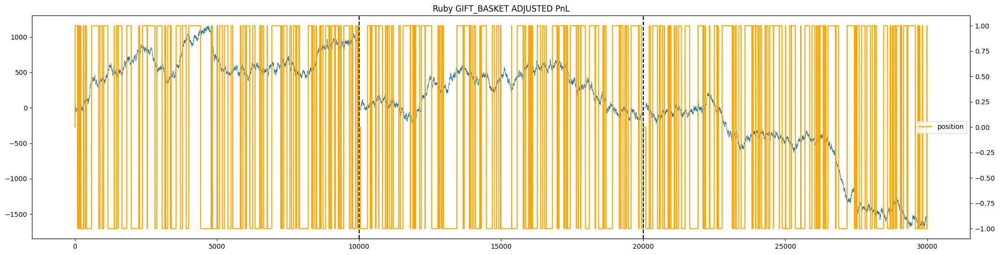

In [520]:
counterparty_df = ruby_r3
for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_signals(PRODUCT)

counterparty_df = ruby_r3
for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_PnL(PRODUCT)

for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_adjusted_PnL(PRODUCT)

In [480]:
counterparty_df = ruby_r3
ruby_r3_report = counterparty_df.generate_summary_report(LAG=[1,5])
ruby_r3_report

,GIFT_BASKET
day1_PnL,4916.000000
day2_PnL,-2955.000000
day3_PnL,7069.000000
total_PnL,13946.000000
lag1_buy_win%,0.480519
lag1_sell_win%,0.456576
lag5_buy_win%,0.490909
lag5_sell_win%,0.468983


## Vinnie

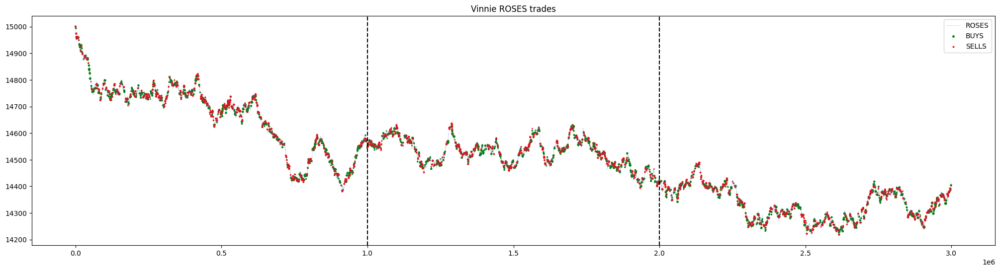

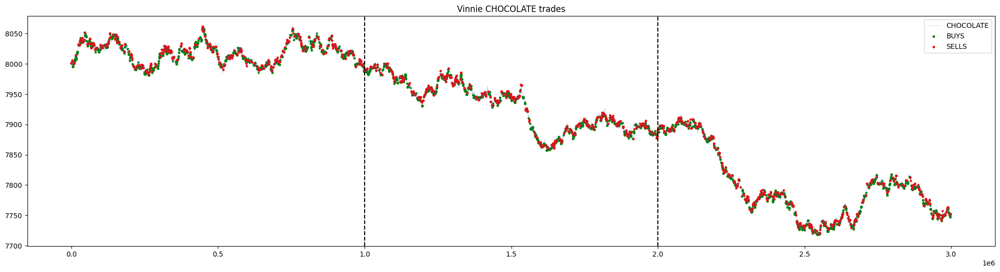

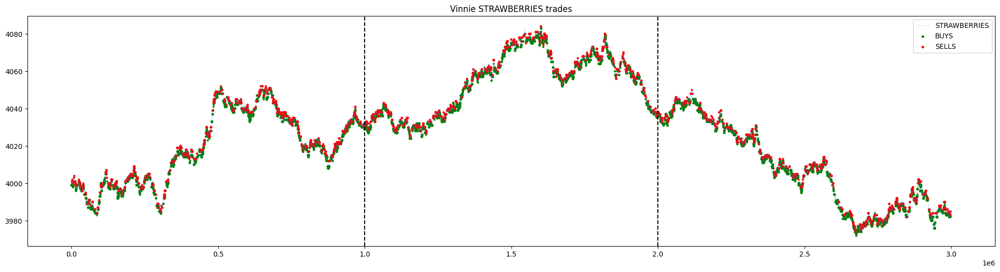

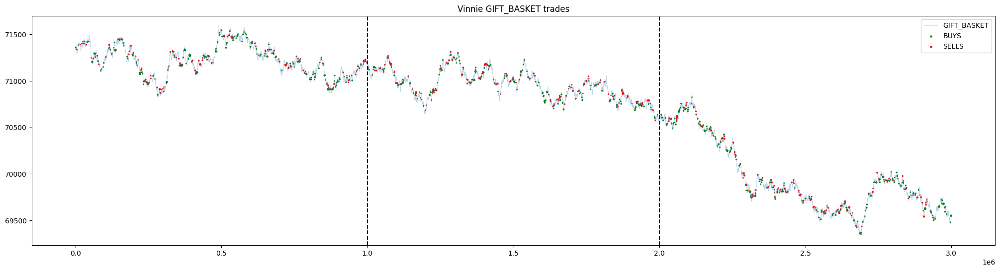

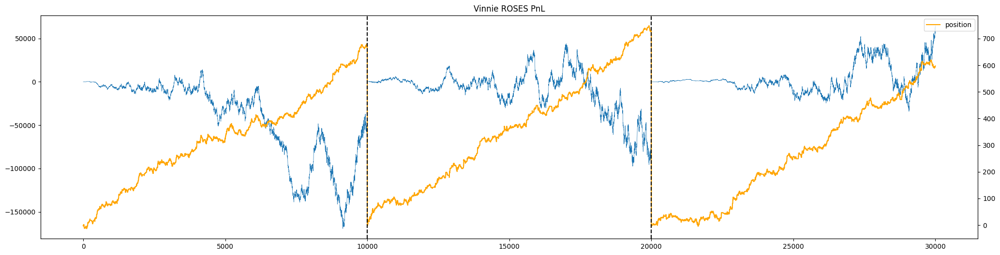

...

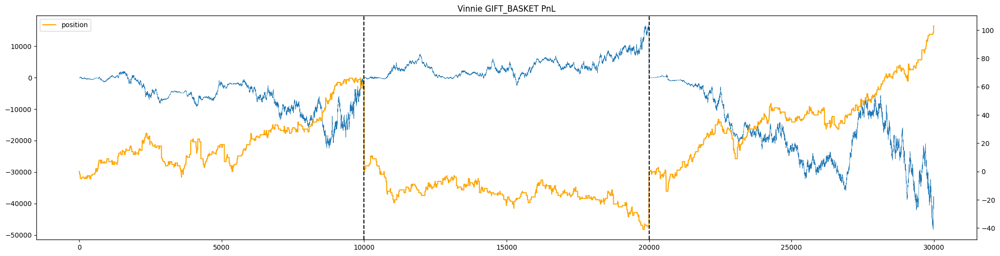

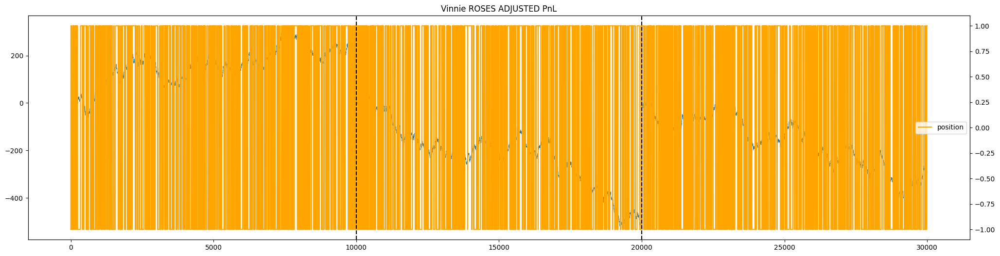

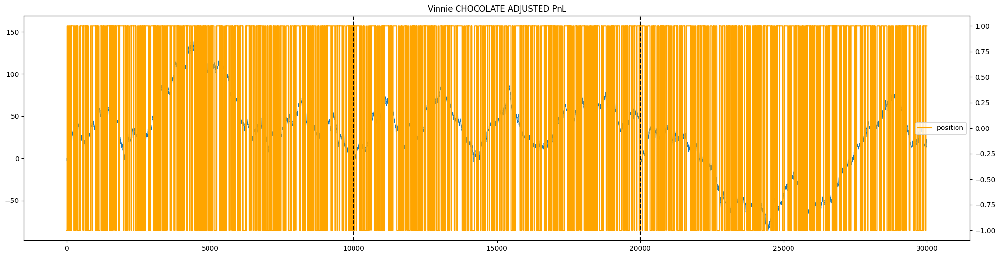

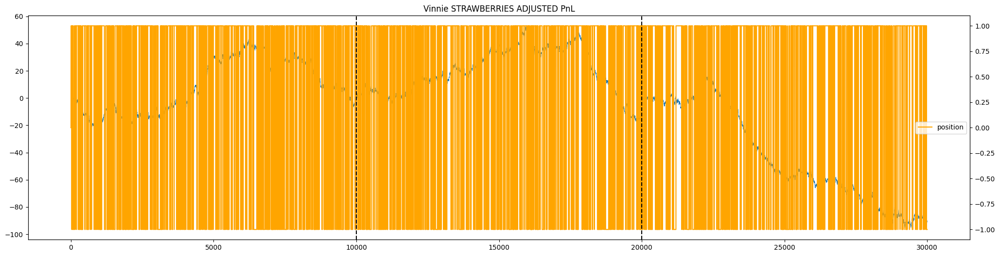

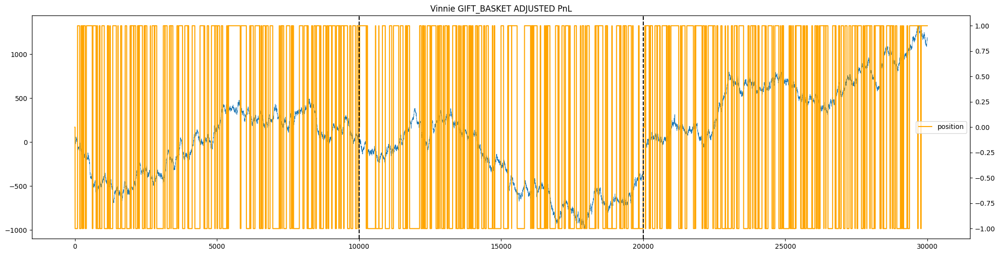

In [521]:
counterparty_df = vinnie_r3
for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_signals(PRODUCT)

counterparty_df = vinnie_r3
for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_PnL(PRODUCT)

for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_adjusted_PnL(PRODUCT)

In [482]:
counterparty_df = vinnie_r3
vinnie_r3_report = counterparty_df.generate_summary_report(LAG=[1,5])
vinnie_r3_report

,ROSES,CHOCOLATE,STRAWBERRIES,GIFT_BASKET
day1_PnL,-65780.500000,-46517.500000,34590.000000,-7413.500000
day2_PnL,-11789.500000,-448.500000,-86225.500000,22985.000000
day3_PnL,207403.000000,12076.000000,-51488.500000,-47065.500000
total_PnL,64052.500000,-81407.500000,-68534.000000,-38907.500000
lag1_buy_win%,0.439834,0.390837,0.260417,0.573477
lag1_sell_win%,0.554770,0.654528,0.558347,0.454733
lag5_buy_win%,0.470065,0.453620,0.363333,0.512545
lag5_sell_win%,0.585866,0.755369,0.755267,0.539095


In [483]:
counterparty_df = vinnie_r3
vinnie_r3_report = counterparty_df.generate_summary_report(LAG=[1,2,3,4,5,10,15,20,30])
vinnie_r3_report

,ROSES,CHOCOLATE,STRAWBERRIES,GIFT_BASKET
day1_PnL,-65780.500000,-46517.500000,34590.000000,-7413.500000
day2_PnL,-11789.500000,-448.500000,-86225.500000,22985.000000
day3_PnL,207403.000000,12076.000000,-51488.500000,-47065.500000
total_PnL,64052.500000,-81407.500000,-68534.000000,-38907.500000
lag1_buy_win%,0.439834,0.390837,0.260417,0.573477
lag1_sell_win%,0.554770,0.654528,0.558347,0.454733
lag2_buy_win%,0.451689,0.421946,0.305833,0.526882
lag2_sell_win%,0.571025,0.717087,0.639384,0.506173
lag3_buy_win%,0.453468,0.427036,0.350000,0.525090
lag3_sell_win%,0.593640,0.746032,0.706645,0.528807


## Vladimir

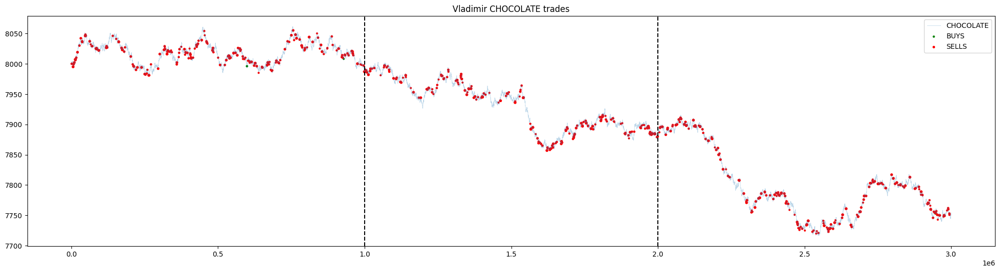

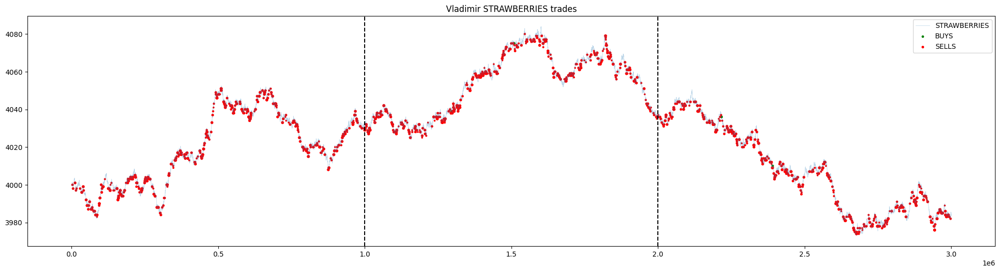

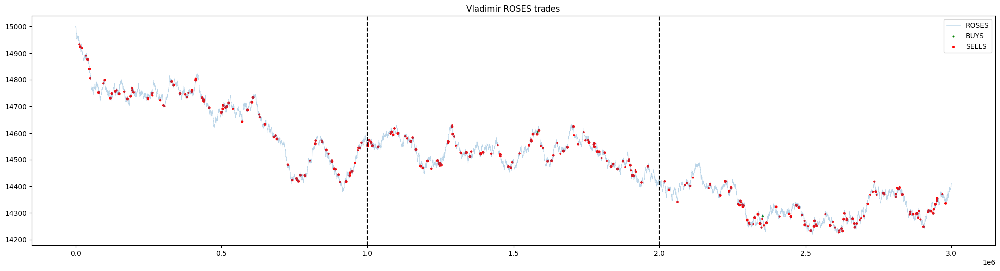

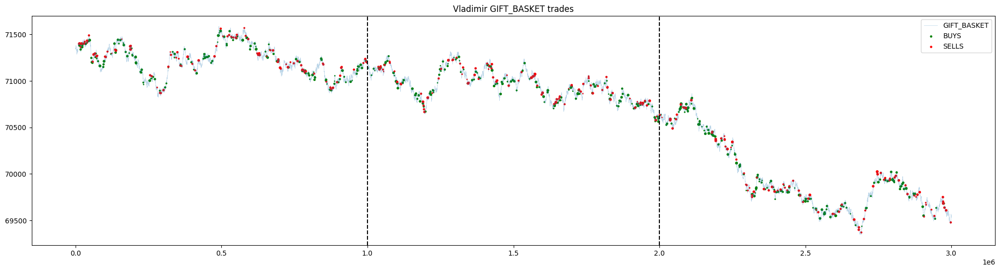

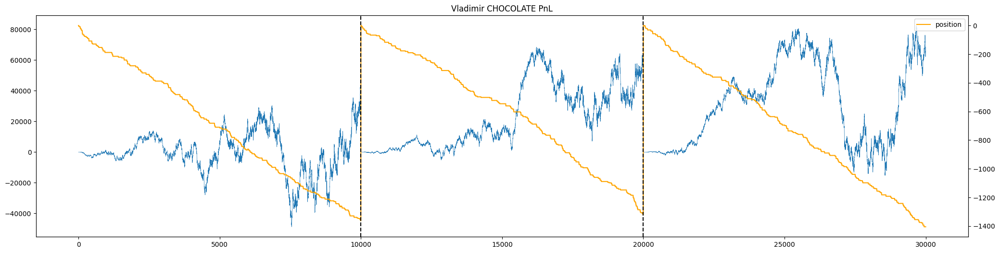

...

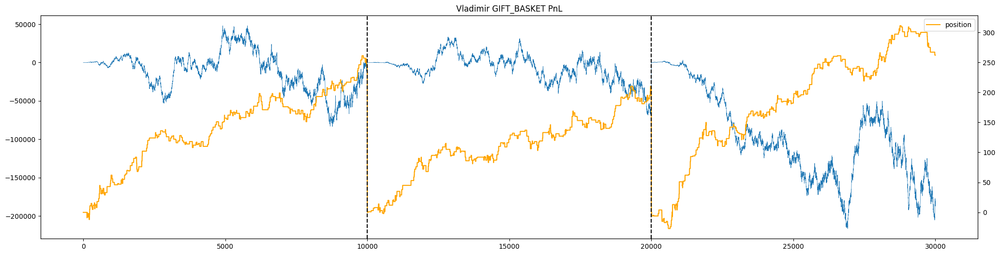

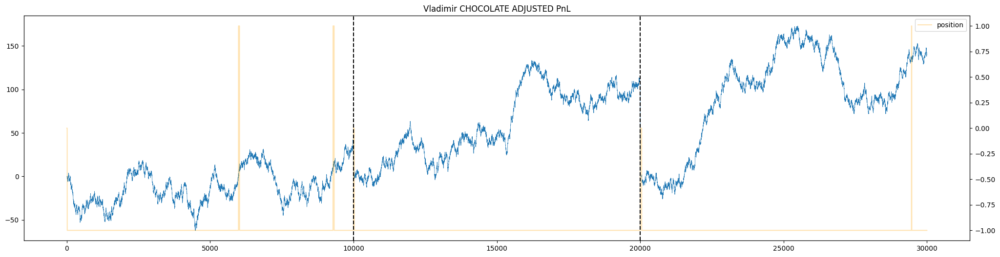

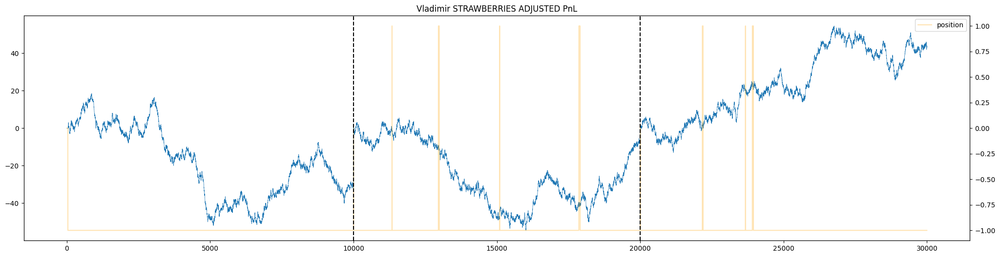

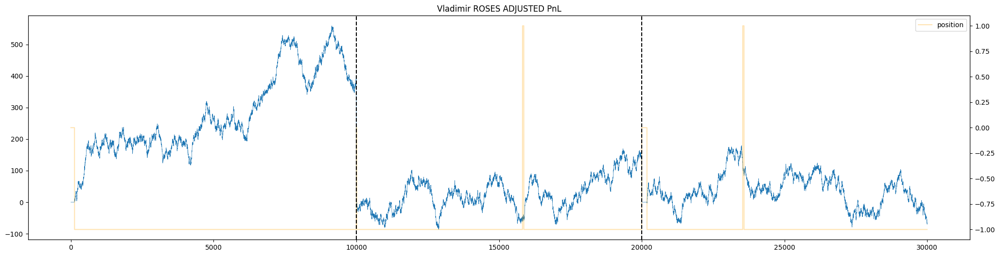

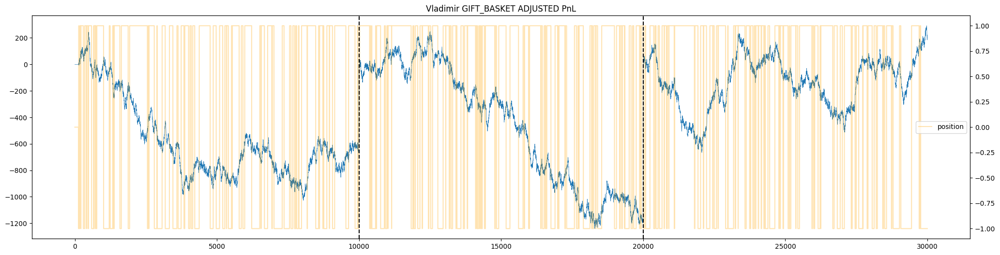

In [530]:
counterparty_df = vladimir_r3
for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_signals(PRODUCT)

counterparty_df = vladimir_r3
for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_PnL(PRODUCT)
for PRODUCT in counterparty_df.get_products():
    counterparty_df.plot_adjusted_PnL(PRODUCT)

In [485]:
counterparty_df = vladimir_r3
vladimir_r3_report = counterparty_df.generate_summary_report(LAG=[1,5])
vladimir_r3_report

,CHOCOLATE,STRAWBERRIES,ROSES,GIFT_BASKET
day1_PnL,40402.000000,-32015.000000,77827.500000,-27035.500000
day2_PnL,8247.000000,80878.500000,1663.500000,-36889.500000
day3_PnL,-20518.500000,49205.000000,-225925.000000,-89429.500000
total_PnL,68532.500000,66053.500000,-68606.500000,-180390.000000
lag1_buy_win%,0.333333,0.000000,0.500000,0.545259
lag1_sell_win%,0.001698,0.004195,0.003215,0.686620
lag5_buy_win%,0.333333,0.000000,0.500000,0.551724
lag5_sell_win%,0.003396,0.003356,0.003215,0.718310


# Round 4

1. Vinnie very low rates (possible misleading signals?)

In [486]:
counterparty_trades("Valentina", R4, R4_price).get_counterparty()

{'Raj', 'Rhianna', 'Ruby', 'Valentina', 'Vinnie', 'Vladimir'}

In [550]:
valentina_r4 = counterparty_trades("Valentina", R4, R4_price)
raj_r4 = counterparty_trades("Raj", R4, R4_price)
rhianna_r4 = counterparty_trades("Rhianna", R4, R4_price)
ruby_r4 = counterparty_trades("Ruby", R4, R4_price)
vinnie_r4 = counterparty_trades("Vinnie", R4, R4_price)
vladimir_r4 = counterparty_trades("Vladimir", R4, R4_price)

## Valentina

In [551]:
counterparty = valentina_r4
for PRODUCT in counterparty.get_products():
    if PRODUCT!='COCONUT_COUPON':
        counterparty.plot_signals(PRODUCT)
        counterparty.plot_PnL(PRODUCT)
        counterparty_df.plot_adjusted_PnL(PRODUCT)

In [538]:
counterparty_df = valentina_r4
valentina_r4_report = counterparty_df.generate_summary_report(LAG=[1,5])
valentina_r4_report

,COCONUT_COUPON
day1_PnL,187328.500000
day2_PnL,-630166.000000
day3_PnL,211885.000000
total_PnL,-43624.000000
lag1_buy_win%,0.355196
lag1_sell_win%,1.342772
lag5_buy_win%,0.421177
lag5_sell_win%,1.688525


## Raj

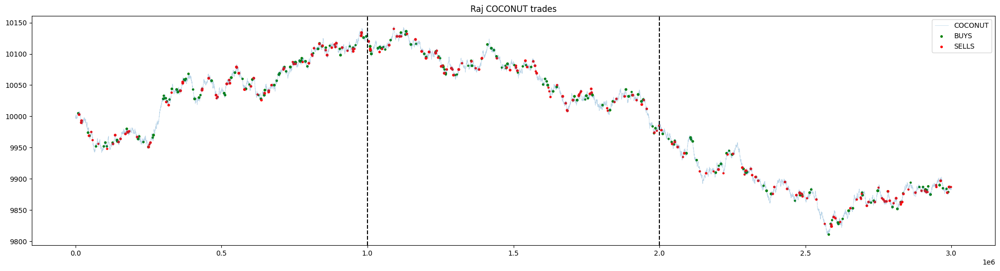

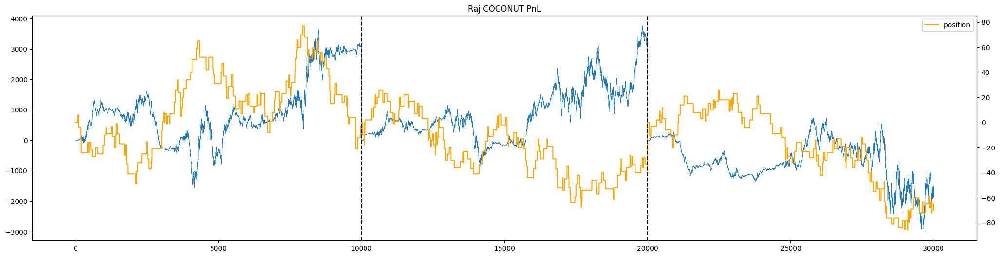

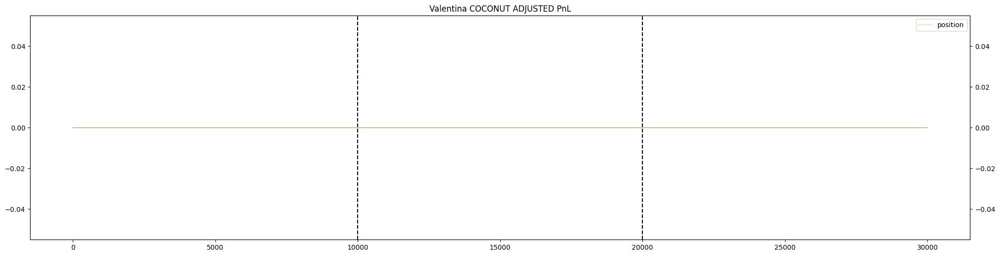

In [552]:
counterparty = raj_r4
for PRODUCT in counterparty.get_products():
    if PRODUCT!='COCONUT_COUPON':
        counterparty.plot_signals(PRODUCT)
        counterparty.plot_PnL(PRODUCT)
        counterparty_df.plot_adjusted_PnL(PRODUCT)

In [491]:
counterparty_df = raj_r4
raj_r4_report = counterparty_df.generate_summary_report(LAG=[1,5])
raj_r4_report

,COCONUT
day1_PnL,3068.500000
day2_PnL,-17.000000
day3_PnL,-7611.500000
total_PnL,-1491.500000
lag1_buy_win%,0.347619
lag1_sell_win%,0.425339
lag5_buy_win%,0.457143
lag5_sell_win%,0.434389


## Rhianna

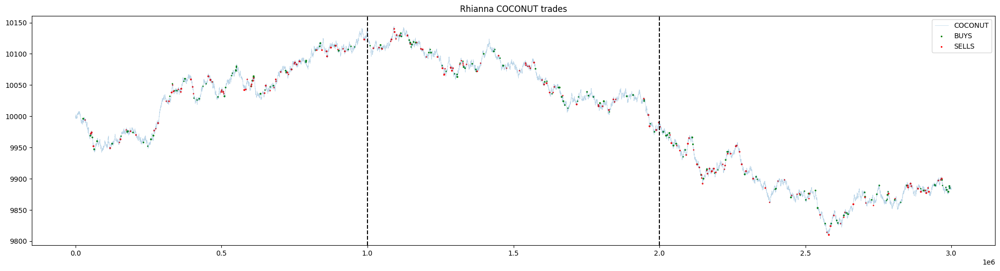

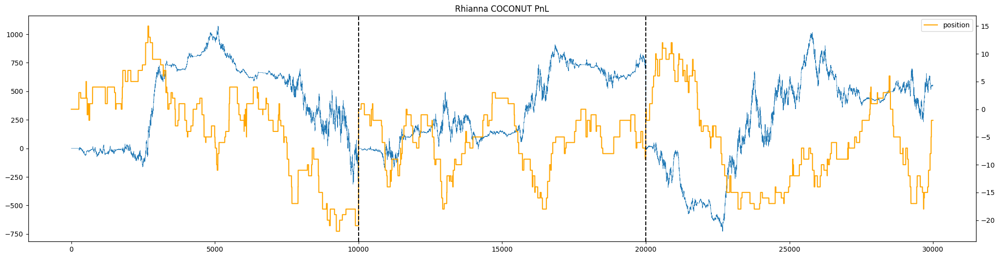

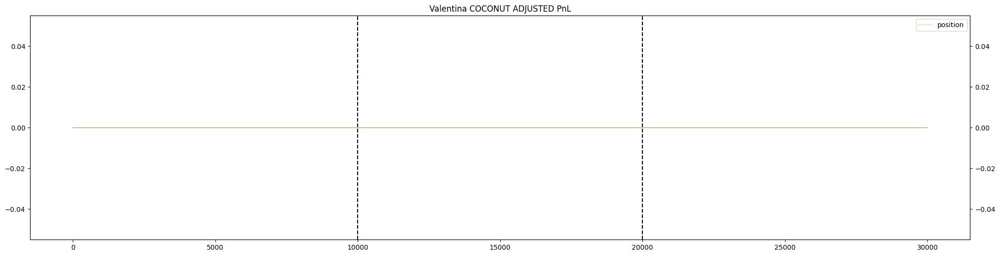

In [546]:
counterparty = rhianna_r4
for PRODUCT in counterparty.get_products():
    if PRODUCT!='COCONUT_COUPON':
        counterparty.plot_signals(PRODUCT)
        counterparty.plot_PnL(PRODUCT)
        counterparty_df.plot_adjusted_PnL(PRODUCT)

In [493]:
counterparty_df = rhianna_r4
rhianna_r4_report = counterparty_df.generate_summary_report(LAG=[1,5])
rhianna_r4_report

,COCONUT_COUPON,COCONUT
day1_PnL,-28627.500000,-241.000000
day2_PnL,96006.000000,960.500000
day3_PnL,-30167.500000,77.000000
total_PnL,8583.500000,555.500000
lag1_buy_win%,0.500000,0.342541
lag1_sell_win%,0.005155,0.401015
lag5_buy_win%,0.400000,0.447514
lag5_sell_win%,0.012887,0.446701


## Ruby

In [541]:
counterparty = ruby_r4
for PRODUCT in counterparty.get_products():
    if PRODUCT!='COCONUT_COUPON':
        counterparty.plot_signals(PRODUCT)
        counterparty.plot_PnL(PRODUCT)
        counterparty_df.plot_adjusted_PnL(PRODUCT)

In [495]:
counterparty_df = ruby_r4
ruby_r4_report = counterparty_df.generate_summary_report(LAG=[1,5])
ruby_r4_report

,COCONUT_COUPON
day1_PnL,13130.500000
day2_PnL,965.500000
day3_PnL,-22336.000000
total_PnL,4890.500000
lag1_buy_win%,0.339474
lag1_sell_win%,0.321185
lag5_buy_win%,0.450000
lag5_sell_win%,0.346241


## Vinnie

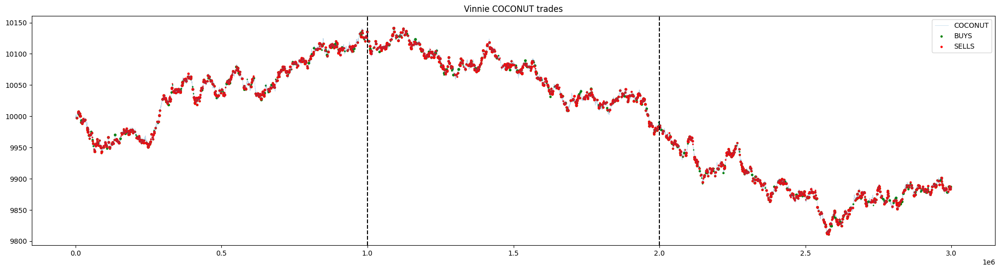

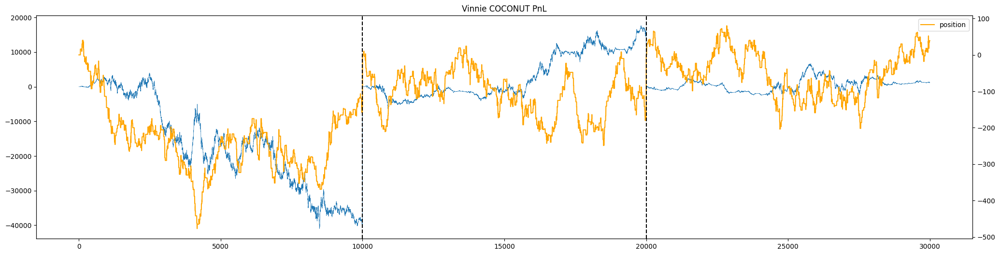

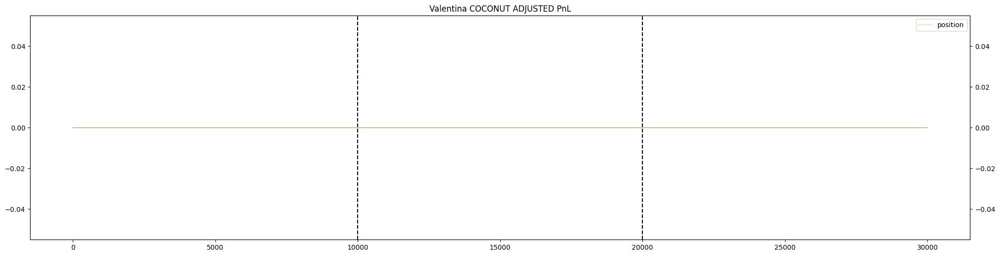

In [542]:
counterparty = vinnie_r4
for PRODUCT in counterparty.get_products():
    if PRODUCT!='COCONUT_COUPON':
        counterparty.plot_signals(PRODUCT)
        counterparty.plot_PnL(PRODUCT)
        counterparty_df.plot_adjusted_PnL(PRODUCT)

In [497]:
counterparty_df = vinnie_r4
vinnie_r4_report = counterparty_df.generate_summary_report(LAG=[1,5])
vinnie_r4_report

,COCONUT_COUPON,COCONUT
day1_PnL,-179239.500000,-39788.500000
day2_PnL,556092.000000,54759.000000
day3_PnL,-171940.000000,25978.000000
total_PnL,25673.000000,1160.000000
lag1_buy_win%,0.440000,0.394804
lag1_sell_win%,0.005545,0.406834
lag5_buy_win%,0.440000,0.446134
lag5_sell_win%,0.007394,0.484848


## Valdimir

In [543]:
counterparty = vladimir_r4
for PRODUCT in counterparty.get_products():
    if PRODUCT!='COCONUT_COUPON':
        counterparty.plot_signals(PRODUCT)
        counterparty.plot_PnL(PRODUCT)
        counterparty_df.plot_adjusted_PnL(PRODUCT)

In [499]:
counterparty_df = vladimir_r4
vladimir_r4_report = counterparty_df.generate_summary_report(LAG=[1,5])
vladimir_r4_report

,COCONUT_COUPON
day1_PnL,11800.500000
day2_PnL,-22864.000000
day3_PnL,-3046.000000
total_PnL,-2309.000000
lag1_buy_win%,0.411215
lag1_sell_win%,1.820513
lag5_buy_win%,0.443925
lag5_sell_win%,2.307692


# Round 1

In [500]:
counterparty_trades("Valentina", R1, R1_price).get_counterparty()

{'Adam',
 'Amelia',
 'Remy',
 'Rhianna',
 'Ruby',
 'Valentina',
 'Vinnie',
 'Vladimir'}

In [501]:
valentina_r1 = counterparty_trades("Valentina", R1, R1_price)
adam_r1 = counterparty_trades("Adam", R1, R1_price)
amelia_r1 = counterparty_trades("Amelia", R1, R1_price)
remy_r1 = counterparty_trades("Remy", R1, R1_price)
rhianna_r1 = counterparty_trades("Rhianna", R1, R1_price)
ruby_r1 = counterparty_trades("Ruby", R1, R1_price)
vinnie_r1 = counterparty_trades("Vinnie", R1, R1_price)
vladimir_r1 = counterparty_trades("Vladimir", R1, R1_price)

# Pair

In [626]:
class counterparty_pairtrades:
    def __init__(self, buyer, seller, trade_df, price_df):
        self.buyer = buyer
        self.seller = seller
        self.trade_df = trade_df
        self.price_df = price_df

    # def get_counterparty(self):
    #     return set(self.trade_df.buyer.unique()).union(set(self.trade_df.seller.unique()))

    def get_products(self):
        return self.trade_df[(self.trade_df['buyer']==self.buyer) & (self.trade_df['seller']==self.seller)]['symbol'].unique()
        
    def compute_signals(self,product):
        buy_signal = self.trade_df[(self.trade_df['buyer']==self.buyer) & (self.trade_df['seller']==self.seller) & (self.trade_df['symbol']==product)]
        sell_signal = self.trade_df[(self.trade_df['buyer']==self.seller) & (self.trade_df['seller']==self.buyer) & (self.trade_df['symbol']==product)]
        return buy_signal, sell_signal

        
    def plot_signals(self, product,start=0,end=30001):

        buy_signal, sell_signal = self.compute_signals(product)
        
        product_df = self.price_df[self.price_df['product']==product]
        product_prices = product_df['mid_price']
        
        plt.figure(figsize=(25, 6))
        plt.title(f"Buyer: {self.buyer} -> Seller: {self.seller} - {product} ")
        plt.plot(product_df['timestamp'].values[start:end],product_df['mid_price'].values[start:end], label=product, linewidth = 0.5,alpha=0.8)
        
        plt.scatter(buy_signal[(buy_signal['timestamp']>start*100) & (buy_signal['timestamp']<end*100)]['timestamp'],
                    buy_signal[(buy_signal['timestamp']>start*100) & (buy_signal['timestamp']<end*100)]['price'], 
                    s=buy_signal[(buy_signal['timestamp']>start*100) & (buy_signal['timestamp']<end*100)]['quantity'],c='green', label='BUYS')
        
        plt.scatter(sell_signal[(sell_signal['timestamp']>start*100) & (sell_signal['timestamp']<end*100)]['timestamp'],
                    sell_signal[(sell_signal['timestamp']>start*100) & (sell_signal['timestamp']<end*100)]['price'], 
                    s=sell_signal[(sell_signal['timestamp']>start*100) & (sell_signal['timestamp']<end*100)]['quantity'], c='red', label='SELLS')
        
        # plt.axvline(x=10**6, color='black', linestyle='--')
        # plt.axvline(x=2*10**6, color='black', linestyle='--')
        plt.legend()
        plt.show()

    def get_position_series(self,product):
        
        buy_signal, sell_signal = self.compute_signals(product)
        sell_signal.loc[:,'quantity'] *= -1
        signals = pd.concat([buy_signal,sell_signal],axis=0).reset_index(drop=True).sort_values(by='timestamp',ascending=True)
        day_length = 10000
        
        day1_pos = pd.Series(0, index=range(day_length))
        day2_pos = pd.Series(0, index=range(day_length))
        day3_pos = pd.Series(0, index=range(day_length))
        
        for t in signals.timestamp:
            if t//1000000==0:
                day1_pos[int(t/100):] += signals.loc[signals['timestamp'] == t, 'quantity'].values[0]
            if t//1000000==1:
                day2_pos[int(t%10**6/100):] += signals.loc[signals['timestamp'] == t, 'quantity'].values[0]
            if t//1000000==2:
                day3_pos[int(t%10**6/100):] += signals.loc[signals['timestamp'] == t, 'quantity'].values[0]

        position_series = pd.concat([day1_pos, day2_pos, day3_pos],axis=0).reset_index(drop=True)
        return position_series

    def get_PnL(self,product):

        position_series = self.get_position_series(product)
        product_prices = self.price_df[self.price_df['product']==product]['mid_price'].reset_index(drop=True)
        pnl_series = position_series * product_prices.diff().shift(-1)
        pnl_series = pnl_series.fillna(0)

        pnl_array = [0]

        for i, pos in enumerate(position_series[1:]):
            i+=1
            if i%10000==0:
                pnl_array.append(0)
                continue
            price_diff = product_prices[i] - product_prices[i-1]
            pnl_array.append(pnl_array[i-1] + price_diff*position_series[i])
        
        return pnl_array

    def plot_PnL(self, product,start=0,end=30001):
        pnl_series = self.get_PnL(product)
        pnl_series = pd.Series(pnl_series)
        position_series = self.get_position_series(product)
        
        fig, ax1 = plt.subplots(figsize=(25, 6))
        ax1.set_title(f"Buyer: {self.buyer} -> Seller: {self.seller} - {product} PnL")
        ax1.plot(pnl_series.index[start:end], pnl_series.values[start:end], label=product, linewidth = 0.5)
        
        ax2 = ax1.twinx()
        ax2.plot(position_series.index[start:end], position_series.values[start:end], label='position', color='orange')

        # plt.axvline(x=10**4, color='black', linestyle='--')
        # plt.axvline(x=2*10**4, color='black', linestyle='--')
        plt.legend()
        plt.show()

    def generate_summary_report(self, LAG=[1]):
        
        report_df = [self.pnl_report()]
        
        for i in LAG:
            report_df.append(self.lag_signal_report(LAG=i))
        
        report_df = pd.concat(report_df,axis=0)
        
        return report_df

    def pnl_report(self):
        pnl = {}
        products = self.get_products()
        for product in products:
            pnl[product] = []
            pnl[product].append(self.get_PnL(product)[9999])
            pnl[product].append(self.get_PnL(product)[19999] - self.get_PnL(product)[9999])
            pnl[product].append(self.get_PnL(product)[29999] - self.get_PnL(product)[19999] - self.get_PnL(product)[9999])
            pnl[product].append(self.get_PnL(product)[29999])

        pnl_df = pd.DataFrame(pnl, index=['day1_PnL','day2_PnL','day3_PnL','total_PnL'])
        return pnl_df
    
    def lag_signal_report(self, LAG=1):
        lag_winrate = {}
        products = self.get_products()
        
        for product in products:
            lag_winrate[product] = []
            # generate win rates (1 day lag - see if its leading indicator)
            buy_signal, sell_signal = self.compute_signals(product)
            product_df = self.price_df[self.price_df['product']==product].reset_index(drop=True)
            
            buy_count = len(buy_signal)
            buy_win = 0
            for timestamp in buy_signal.timestamp:
                try:
                    diff = product_df[product_df['timestamp']==timestamp+LAG*100]['mid_price'].values[0] - product_df[product_df['timestamp']==timestamp]['mid_price'].values[0]
                    if diff > 0:
                        buy_win += 1
                except:
                    continue

            lag_winrate[product].append(buy_win/buy_count)

            sell_count = len(sell_signal)
            sell_win = 0
            for timestamp in buy_signal.timestamp:
                try:
                    diff = product_df[product_df['timestamp']==timestamp+LAG*100]['mid_price'].values[0] - product_df[product_df['timestamp']==timestamp]['mid_price'].values[0]
                    if diff < 0:
                        sell_win += 1
                except:
                    continue

            lag_winrate[product].append(sell_win/sell_count)

        lag_winrate_df = pd.DataFrame(lag_winrate, index=[f'lag{LAG}_buy_win%', f'lag{LAG}_sell_win%'])

        return lag_winrate_df

    def get_adjusted_position_series(self, product):
        buy_signal, sell_signal = self.compute_signals(product)
        sell_signal.loc[:,'quantity'] *= -1
        signals = pd.concat([buy_signal,sell_signal],axis=0).reset_index(drop=True).sort_values(by='timestamp',ascending=True)
        day_length = 10000
        
        day1_pos = pd.Series(0, index=range(day_length))
        day2_pos = pd.Series(0, index=range(day_length))
        day3_pos = pd.Series(0, index=range(day_length))
        
        for t in signals.timestamp:
            
            signal = signals.loc[signals['timestamp'] == t, 'quantity'].values[0]
            if signal > 0:
                signal = 1
            elif signal < 0:
                signal = -1
            else:
                signal = 0
                
            if t//1000000==0:
                day1_pos[int(t/100):] = signal
            if t//1000000==1:
                day2_pos[int(t%10**6/100):] = signal
            if t//1000000==2:
                day3_pos[int(t%10**6/100):] = signal

        position_series = pd.concat([day1_pos, day2_pos, day3_pos],axis=0).reset_index(drop=True)
        return position_series

    def get_adjusted_PnL(self,product):

        position_series = self.get_adjusted_position_series(product)
        product_prices = self.price_df[self.price_df['product']==product]['mid_price'].reset_index(drop=True)
        pnl_series = position_series * product_prices.diff().shift(-1)
        pnl_series = pnl_series.fillna(0)

        pnl_array = [0]

        for i, pos in enumerate(position_series[1:]):
            i+=1
            if i%10000==0:
                pnl_array.append(0)
                continue
            price_diff = product_prices[i] - product_prices[i-1]
            pnl_array.append(pnl_array[i-1] + price_diff*position_series[i])
        
        return pnl_array

    def plot_adjusted_PnL(self, product,start=0,end=30001):
        pnl_series = self.get_adjusted_PnL(product)
        pnl_series = pd.Series(pnl_series)
        position_series = self.get_adjusted_position_series(product)
        
        fig, ax1 = plt.subplots(figsize=(25, 6))
        ax1.set_title(f"Buyer: {self.buyer} -> Seller: {self.seller} - {product} ADJUSTED PnL")
        ax1.plot(pnl_series.index[start:end], pnl_series.values[start:end], label=product, linewidth = 0.5)
        
        ax2 = ax1.twinx()
        ax2.plot(position_series.index[start:end], position_series.values[start:end], label='position', color='orange',alpha=0.3)

        
        # plt.axvline(x=10**4, color='black', linestyle='--')
        # plt.axvline(x=2*10**4, color='black', linestyle='--')
        plt.legend()
        plt.show()

## Idea

1. Remy, Vinnie pair on strawberries
   - Buy when vinnie buy, sell when remy sell

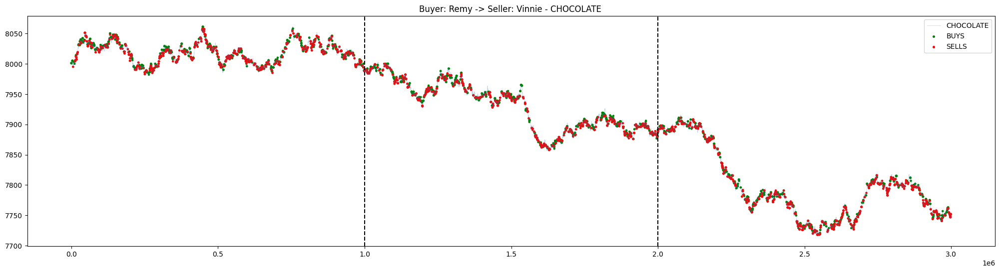

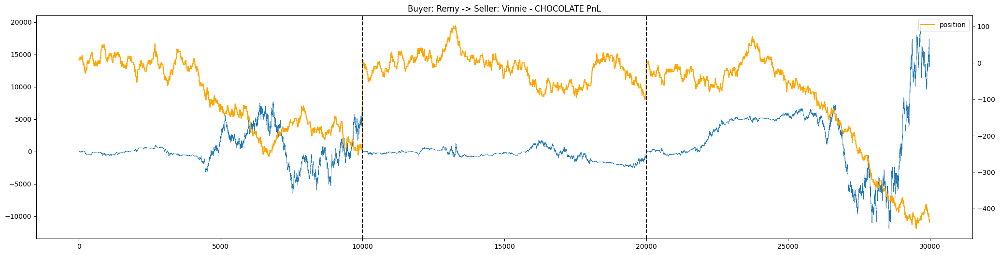

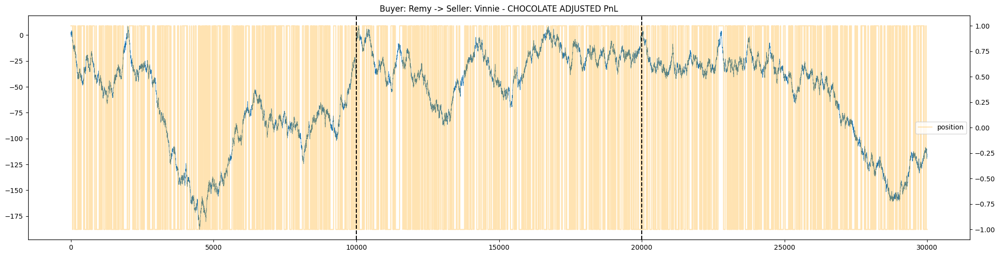

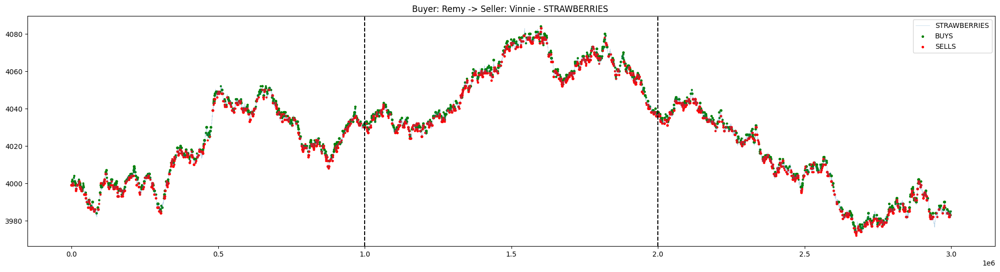

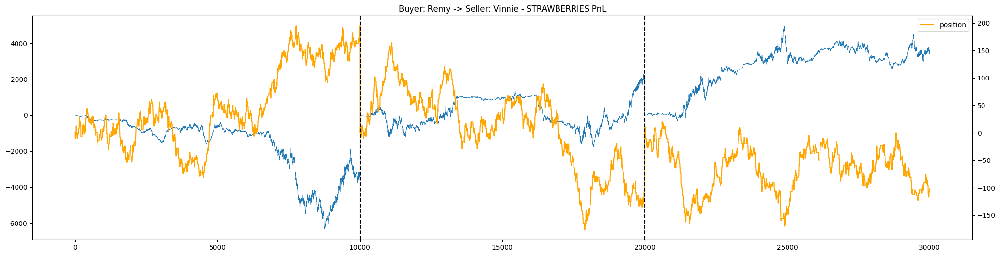

...

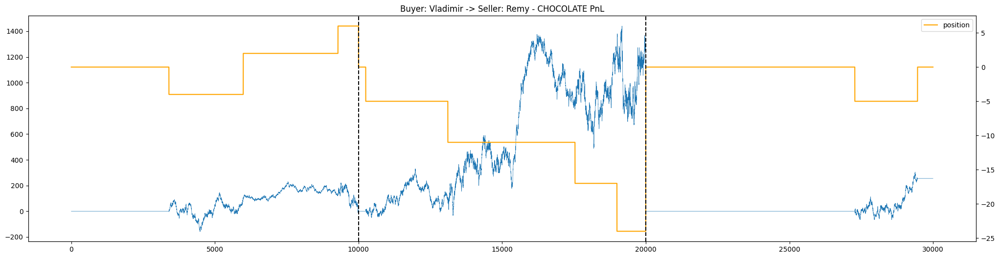

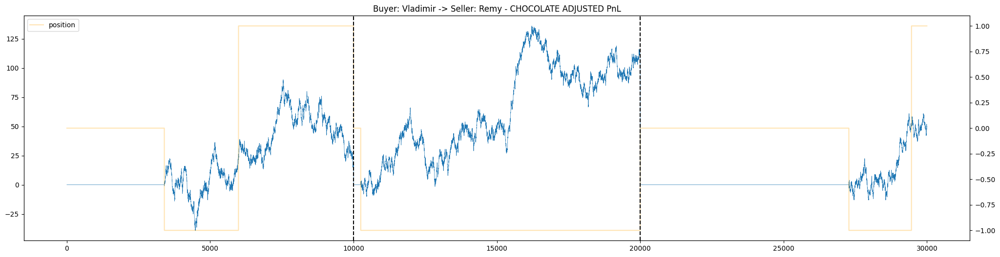

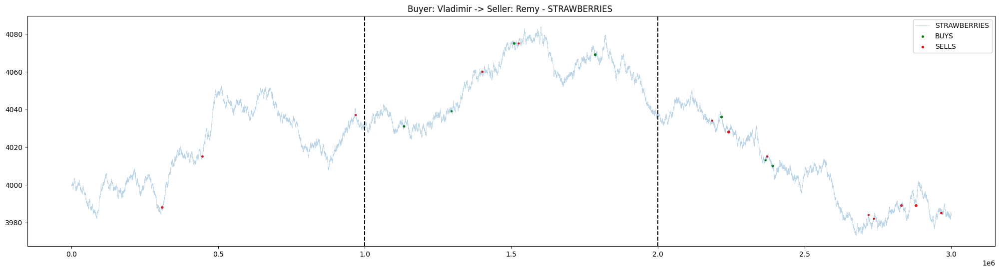

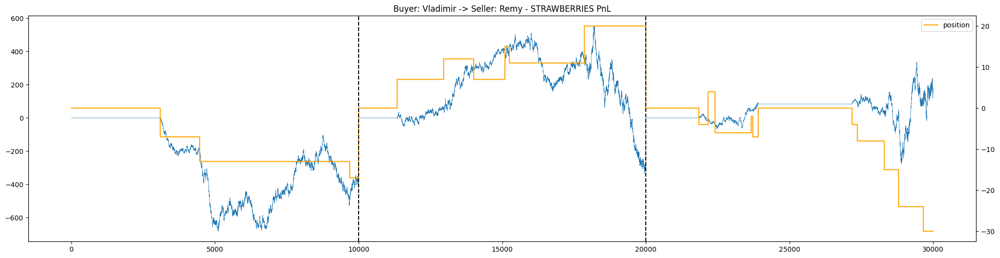

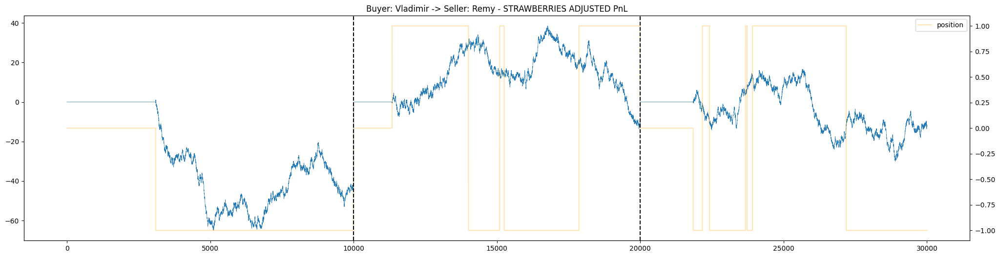

In [555]:
trade_df = R3
price_df = R3_price
unique_pairs = R3[['buyer','seller']].drop_duplicates().values
for buyer, seller in unique_pairs:
    involved_products = trade_df[(trade_df['buyer']==buyer) & (trade_df['seller']==seller)]['symbol'].unique()
    for product in involved_products:
        if product not in ["GIFT_BASKET","ROSES"]:
            counterparty_pairtrades(buyer, seller, trade_df, price_df).plot_signals(product)
            counterparty_pairtrades(buyer, seller, trade_df, price_df).plot_PnL(product)
            counterparty_pairtrades(buyer, seller, trade_df, price_df).plot_adjusted_PnL(product)

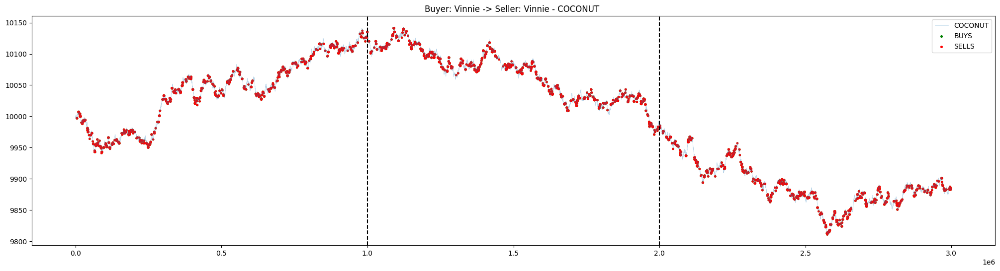

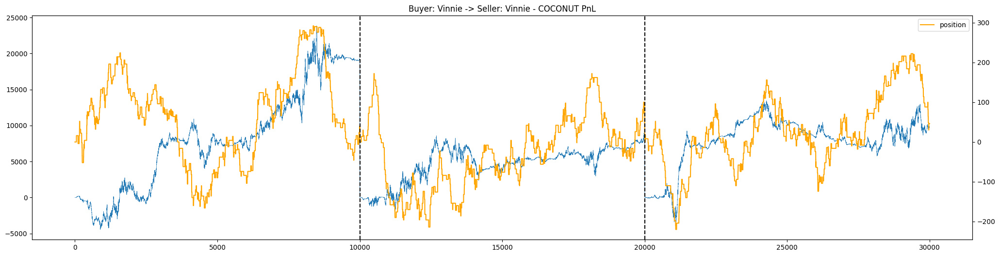

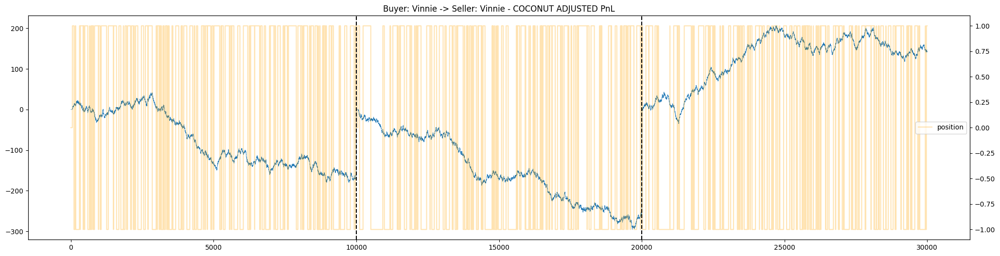

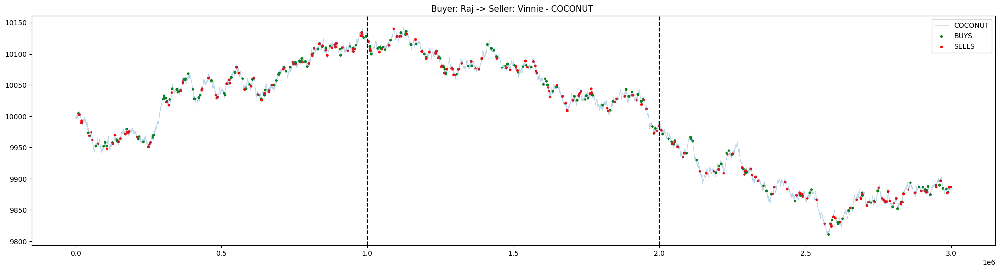

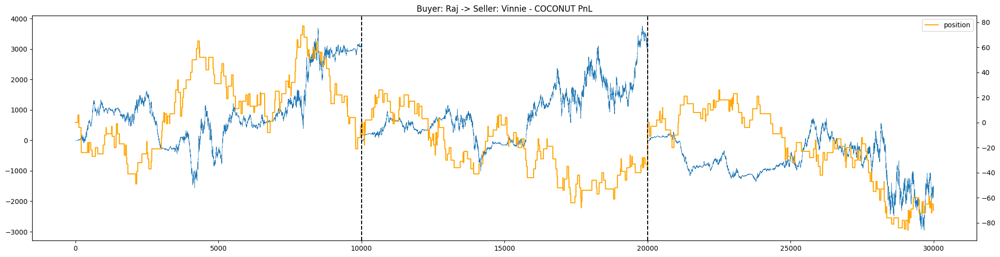

...

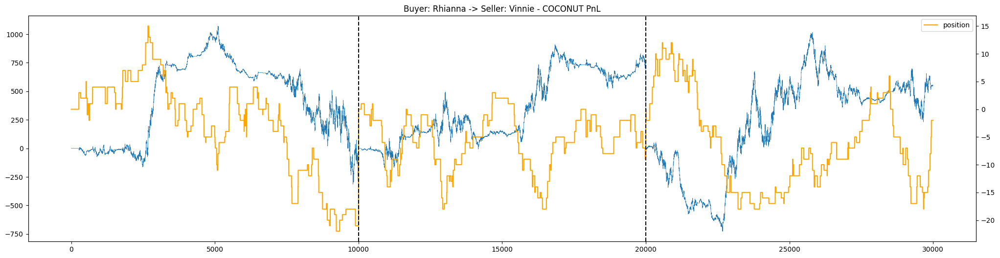

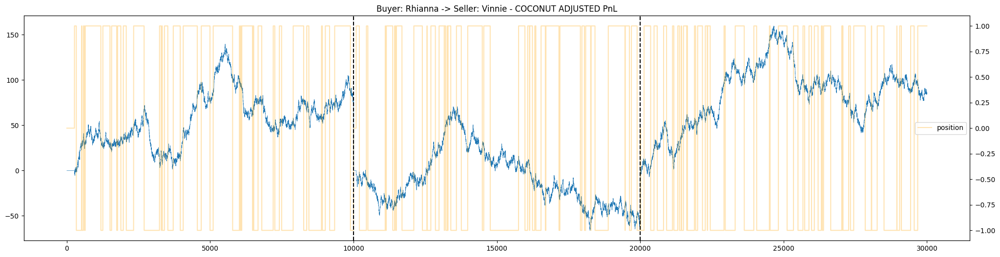

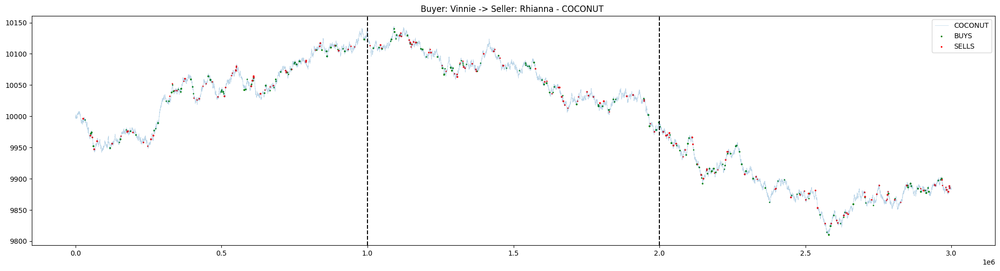

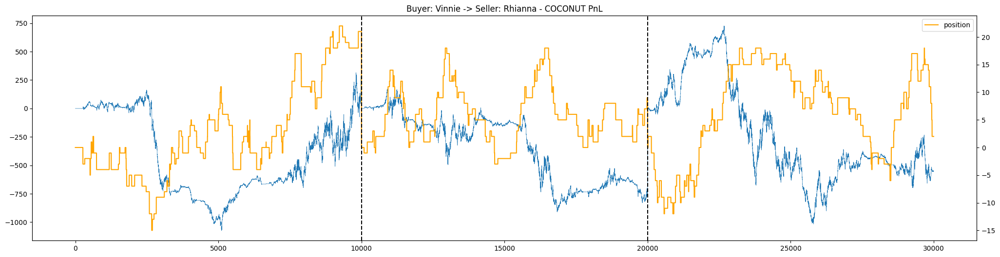

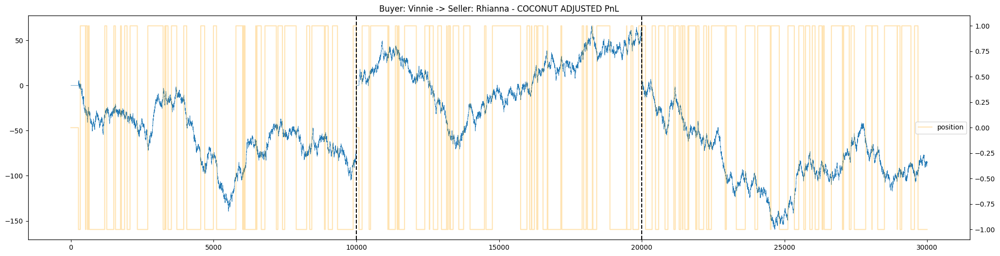

In [556]:
trade_df = R4
price_df = R4_price
unique_pairs = R4[['buyer','seller']].drop_duplicates().values
for buyer, seller in unique_pairs:
    involved_products = trade_df[(trade_df['buyer']==buyer) & (trade_df['seller']==seller)]['symbol'].unique()
    for product in involved_products:
        if product == "COCONUT":
            counterparty_pairtrades(buyer, seller, tradbe_df, price_df).plot_signals(product)
            counterparty_pairtrades(buyer, seller, trade_df, price_df).plot_PnL(product)
            counterparty_pairtrades(buyer, seller, trade_df, price_df).plot_adjusted_PnL(product)

# Micro Analysis

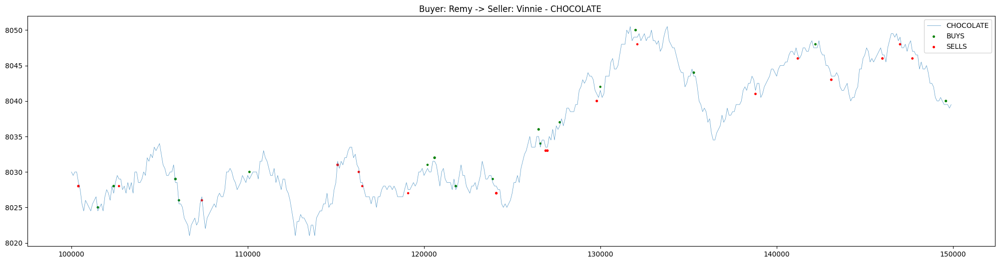

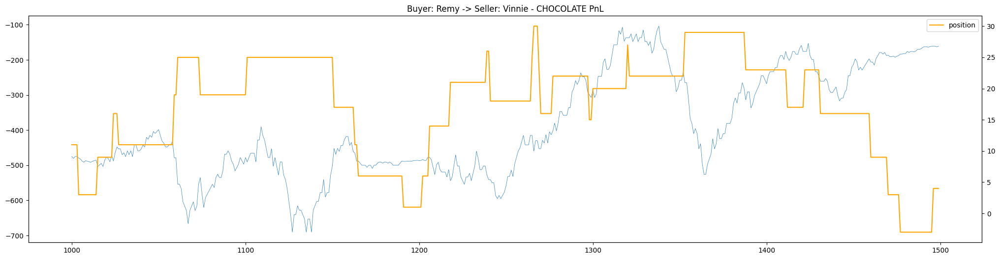

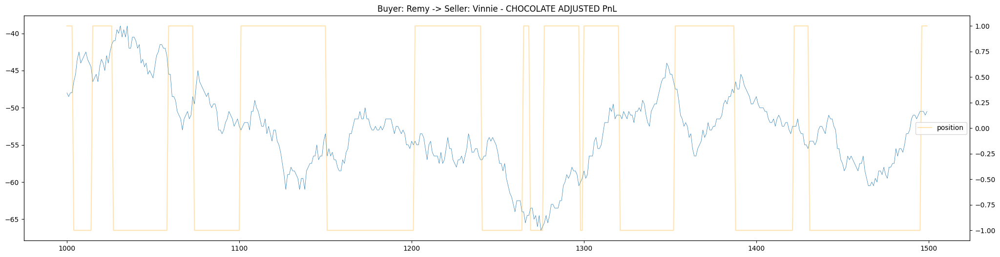

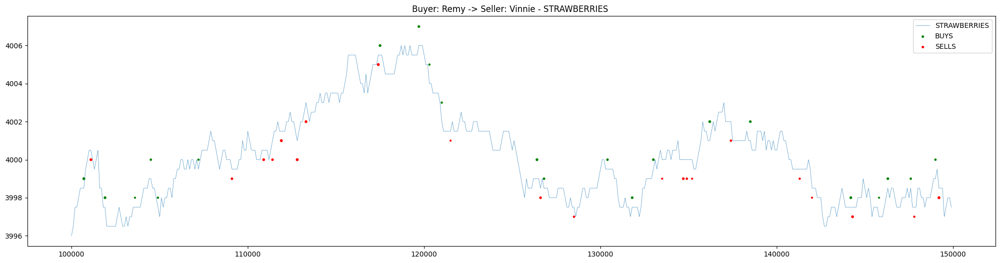

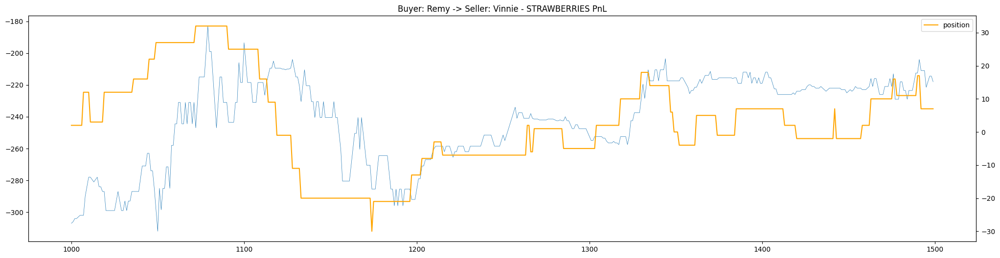

...

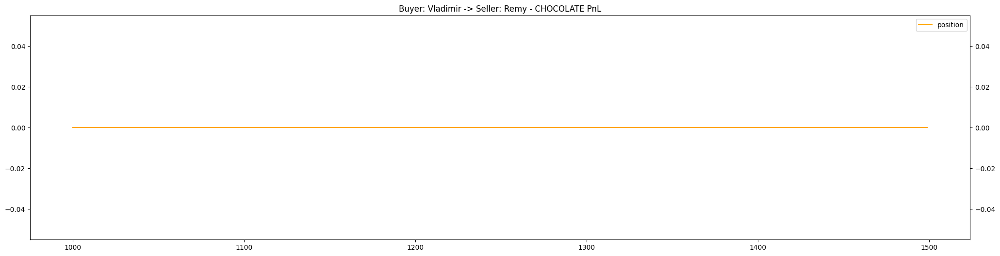

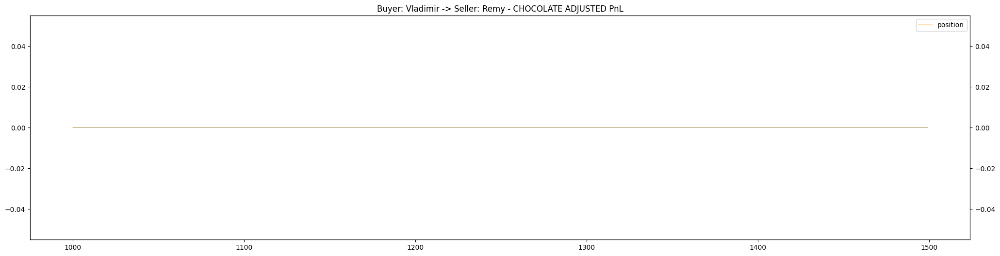

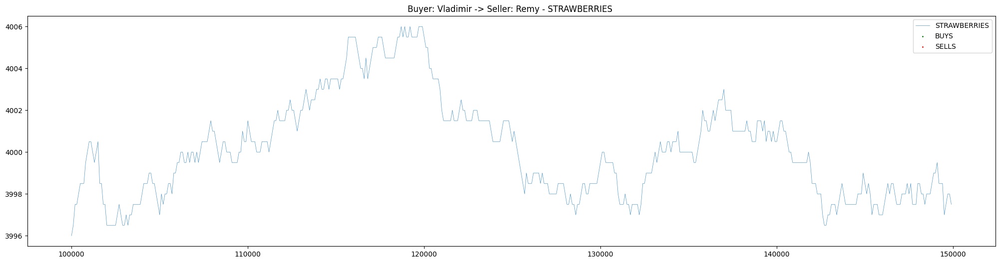

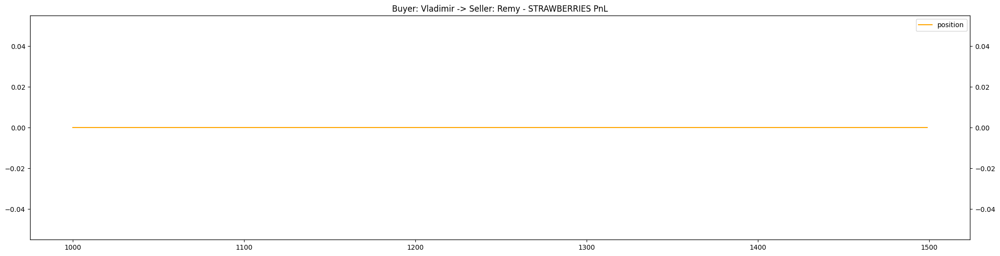

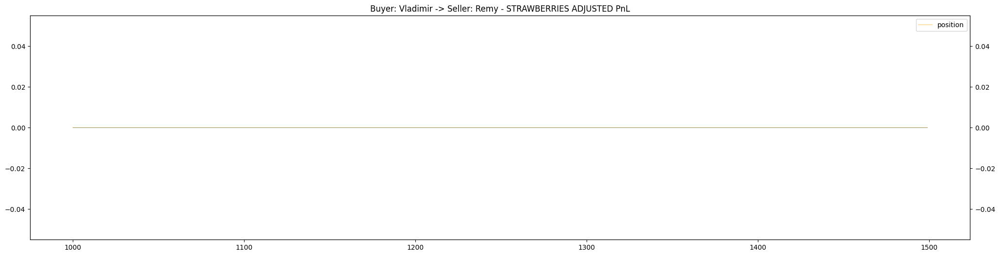

In [629]:
trade_df = R3
price_df = R3_price
unique_pairs = R3[['buyer','seller']].drop_duplicates().values
start = 1000
end = 1500
for buyer, seller in unique_pairs:
    involved_products = trade_df[(trade_df['buyer']==buyer) & (trade_df['seller']==seller)]['symbol'].unique()
    for product in involved_products:
        if product not in ["GIFT_BASKET","ROSES"]:
            counterparty_pairtrades(buyer, seller, trade_df, price_df).plot_signals(product, start=start, end=end)
            counterparty_pairtrades(buyer, seller, trade_df, price_df).plot_PnL(product,start=start, end=end)
            counterparty_pairtrades(buyer, seller, trade_df, price_df).plot_adjusted_PnL(product, start=start, end=end)